# MPP системы

Массово-параллельная архитектура (Massive Parallel Processing, MPP) – это класс параллельных вычислительных систем, состоящих из множества узлов, где каждый узел представляет собой автономную, независимую от других единицу. Если применить это определение к области хранилищ данных, то лучше всего его смысл будет отражать термин «распределённые базы данных». 

Каждый узел в распределенной базе данных представляет собой полноценную СУБД, работающую независимо от других. Сама же распределенная база данных – это совокупность независимых, автономных узлов, связанных коммуникационной сетью. Все данные в такой сети распределяются между узлами равномерно, т.е. каждый узел хранит свою, уникальную часть данных, логически, тем не менее, представляя единую базу данных. Для пользователя распределенная БД выглядит как единая целая, не разделенная на части база данных. При обращении к распределенной СУБД запрос выполняется параллельно всеми узлами базы данных, выполняя поиск и выборку только в своем, уникальном кусочке данных, что позволяет значительно повысить скорость доступа к данным.

Виды архитектур:

    • SE (Shared-Everything) - архитектура с разделяемыми памятью и дисками
    • SD (Shared-Disks) - архитектура с разделяемыми дисками
    • SN (Shared-Nothing) - архитектура без совместного использования ресурсов

### SE (Shared-Everything)

Все процессоры разделяют общую оперативную память. Все диски напрямую доступны всем процессорам с одинаковым временем доступа. Межпроцессорные коммуникации осуществляются
через общую оперативную память. Каждый процессор в SE системе имеет собственную кэш-память.

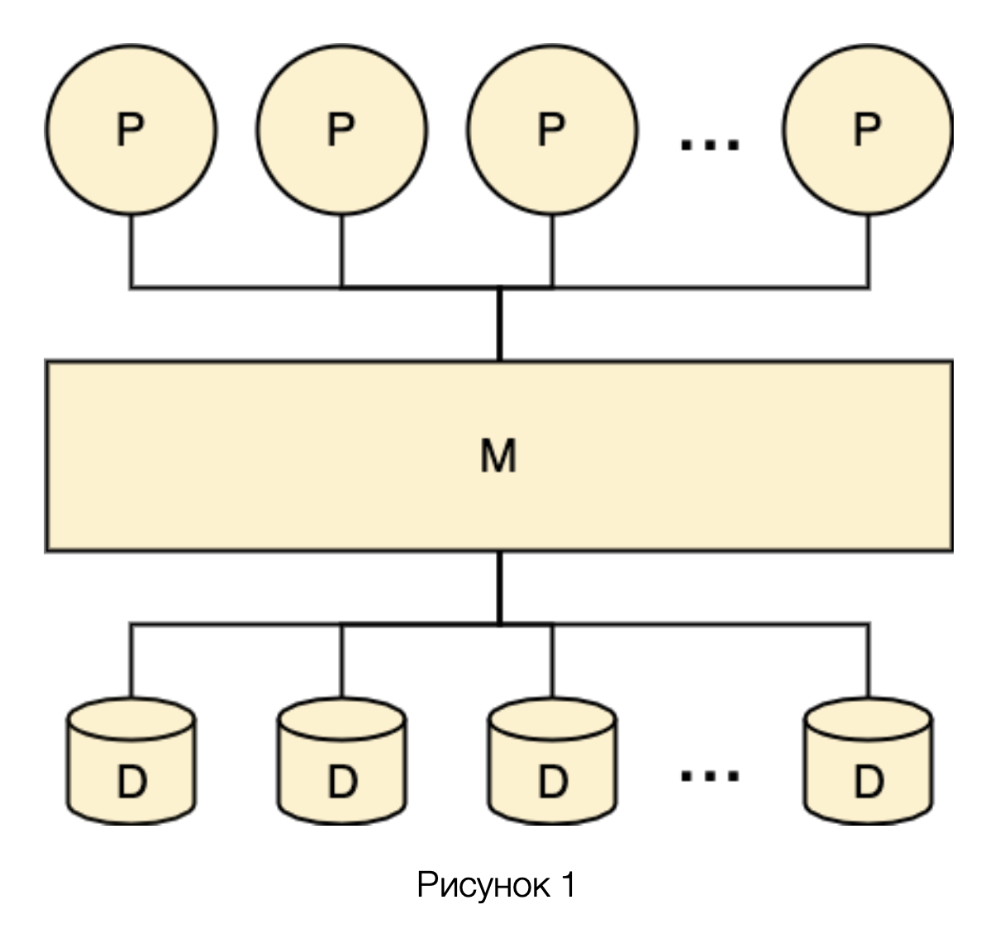

### SD (Shared-Disks)

Каждый процессор имеет свою приватную оперативную память. Все диски доступны всем процессорам с одинаковым временем доступа. Межпроцессорные коммуникации осуществляются через высокоскоростную соединительную сеть.


Аппаратная платформа: MPP или кластеры с разделяемыми дисками

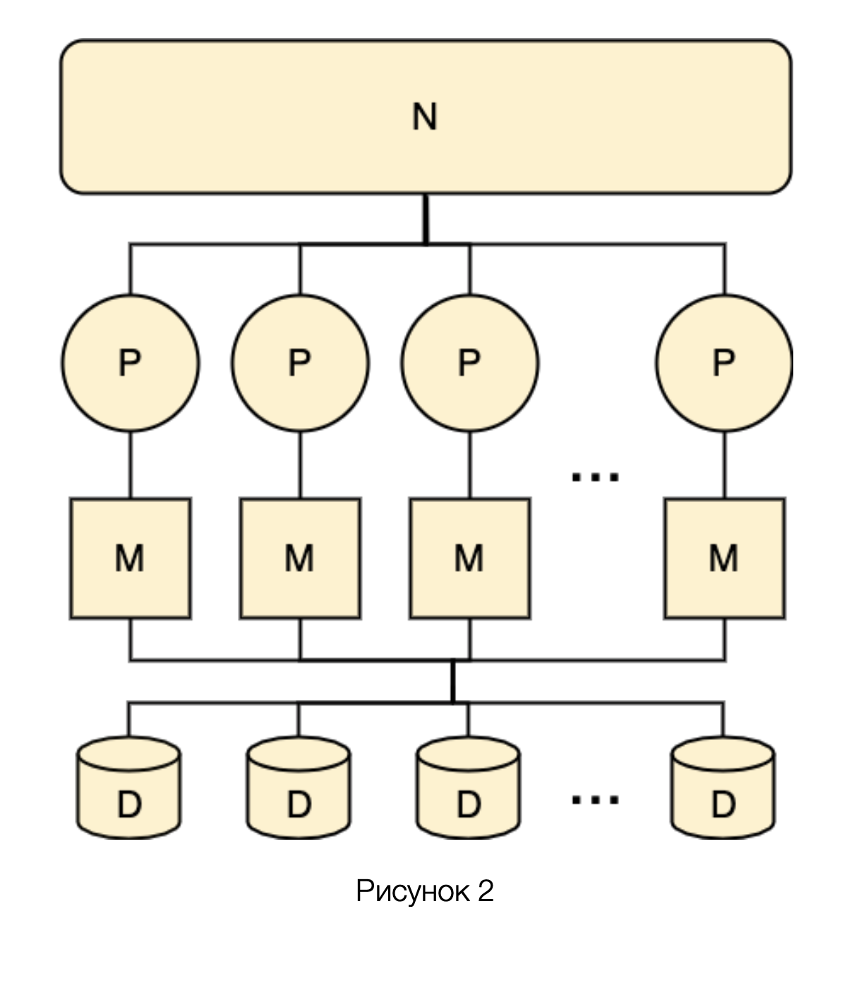

### SN (Shared-Nothing)

Каждый процессор имеет свою приватную оперативную память и диск.
Межпроцессорные коммуникации осуществляются через высокоскоростную соединительную сеть.

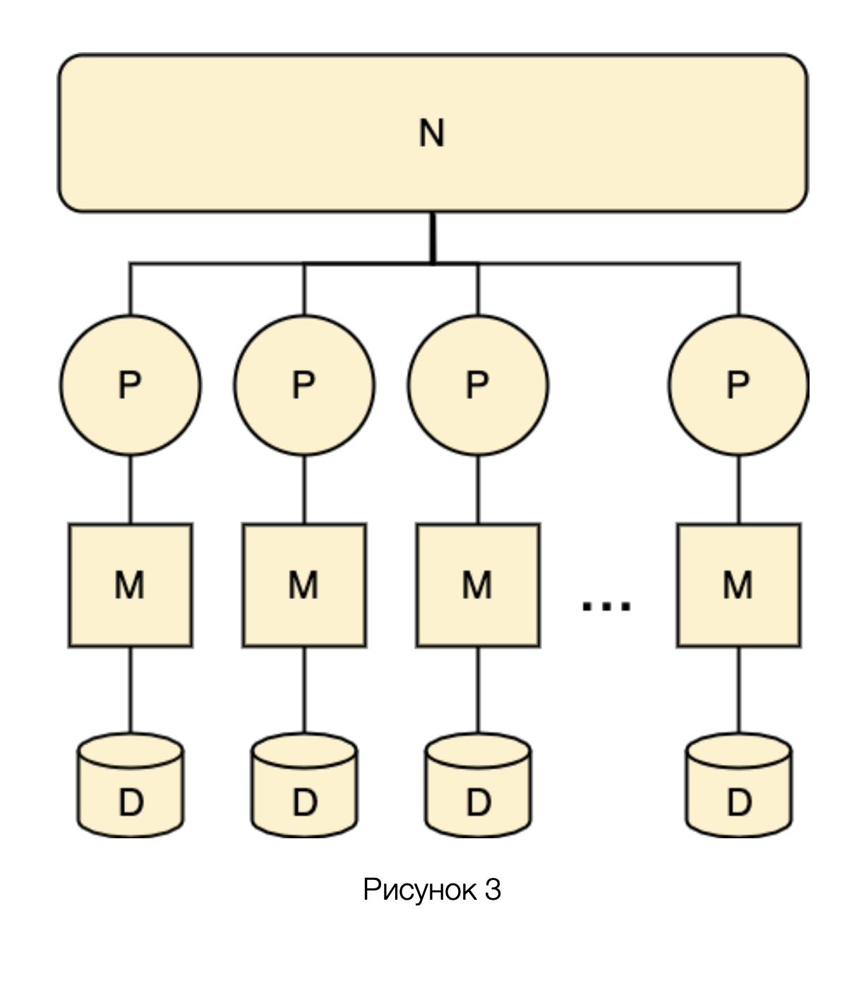

### CD (Clustered-Disk)

SD кластеры объединены по принципу SN. Граница SD кластеров распространены на общую (глобальную) соединительную сеть, так как в них может присутствовать собственная (локальная) соединительная сеть. Межпроцессорные коммуникации осуществляются через высокоскоростную
соединительную сеть.

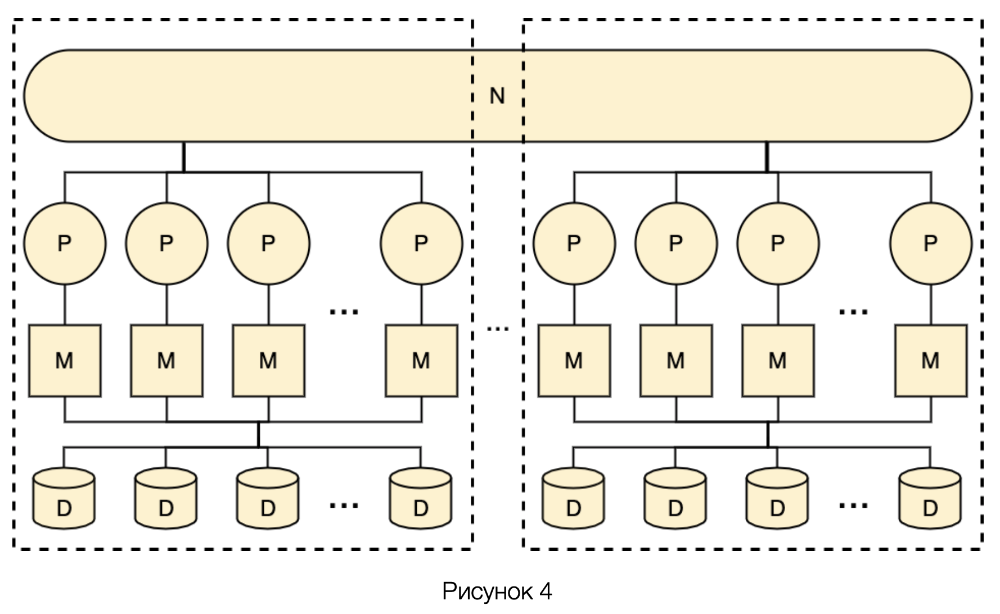

### CE (Clustered-Everything)

SЕ кластеры объединены по принципу SN. Межкластерныее коммуникации осуществляются через высокоскоростную соединительную сеть. Межпроцессорные коммуникации внутри SЕ кластера
осуществляются через общую оперативную память.

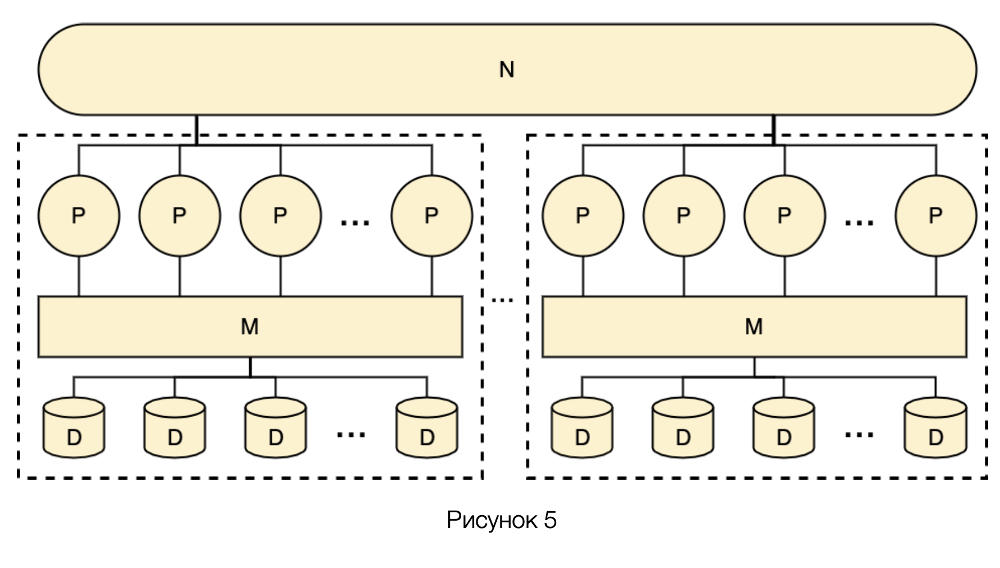

## Teradata

**Teradata** – это параллельная реляционная СУБД.

**Логическая архитектура:**
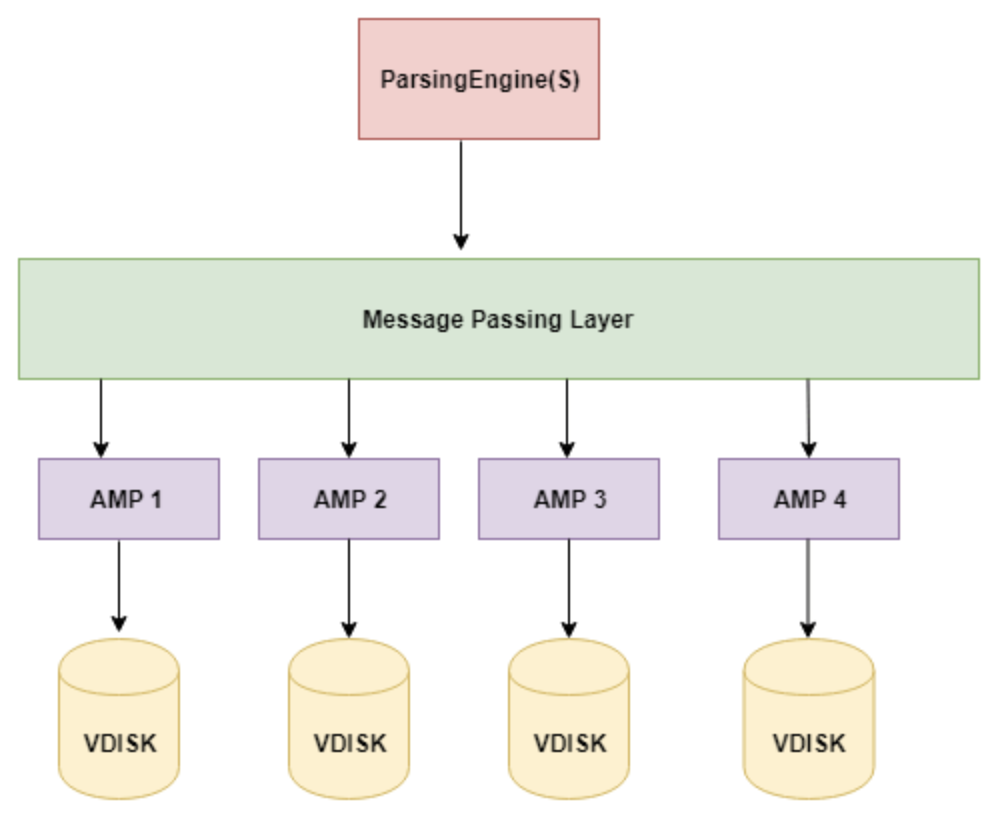

**Parsing Engine** - управление сессиями пользователей, чтение и оптимизация запросов, выдача результатов запросов пользователю.

**Message Passing Layers** - посредник между AMP и PE.

**Access Module Processors** - управляет выделенным пространством, выполняет отправленные операции.

**Virtual Disks** -  выделенное дисковое пространство.

На верхнем уровне процесс выполнения запроса в Teradata выглядит следующим образом:
    
    1) Пользователь, подключаясь к системе Teradata, устанавливает соединение с Parsing Engine (PE). После того как соединение установлено, он может выполнять запросы SQL.

    2) PE проверяет синтаксис полученного SQL-запроса, права пользователя на доступ к информации и создает план выполнения запроса для выполнения компонентом Access Module Processor (AMP).
    
    3)PE направляет шаги плана AMP'ам на выполнение.

    4) AMP’ы извлекают необходимую информацию с ассоциированных с ними дисков и возвращают ее PE. AMP’ы выполняют свою работу параллельно.

    5) PE возвращает результат пользователю.

Существует три основных способа к данным:

    • Использование первичного индекса (один AMP)
    • Использование вторичного индекса (два или все AMP)
    • Полное сканирование таблицы (все AMP)

Первичный индекс не надо путать с первичным ключом:
    
    • Первичный ключ – это понятия из теории реляционных баз данных.
    • Первичный индекс в Teradata задает способ распределения и обработки данных.
    • У большинства таблиц первичный ключ и первичный индекс могут совпадать.

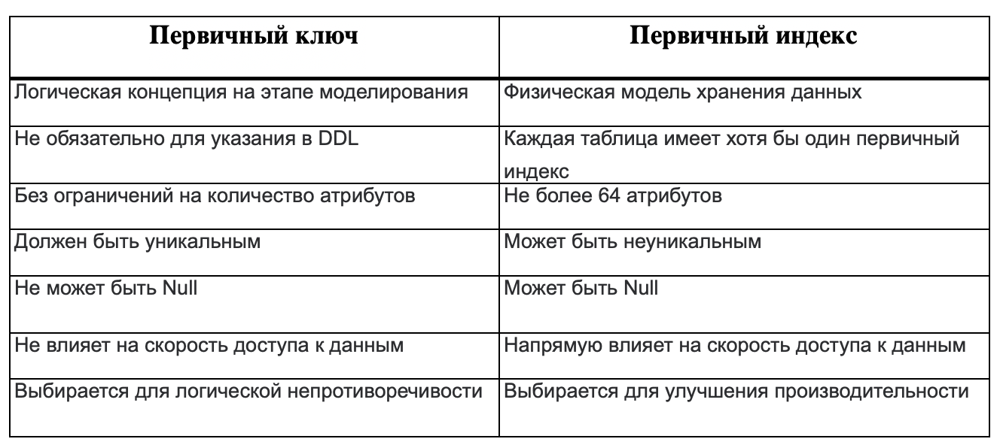

**Распределение данных по узлам:**
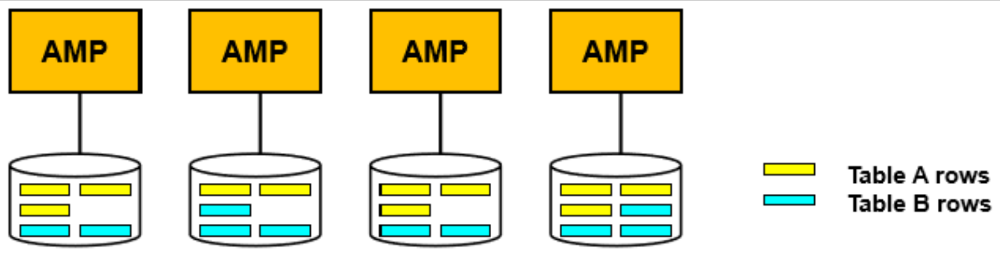

Для таблиц, где задан первичный индекс, распределение по узлам
задается как хеш-функция от колонок первичного ключа. 
Для таблиц, где первичный индекс не задан, распределение строк
происходит по случайному алгоритму

**Доступ к данным с помощью уникального первичного индекса:**
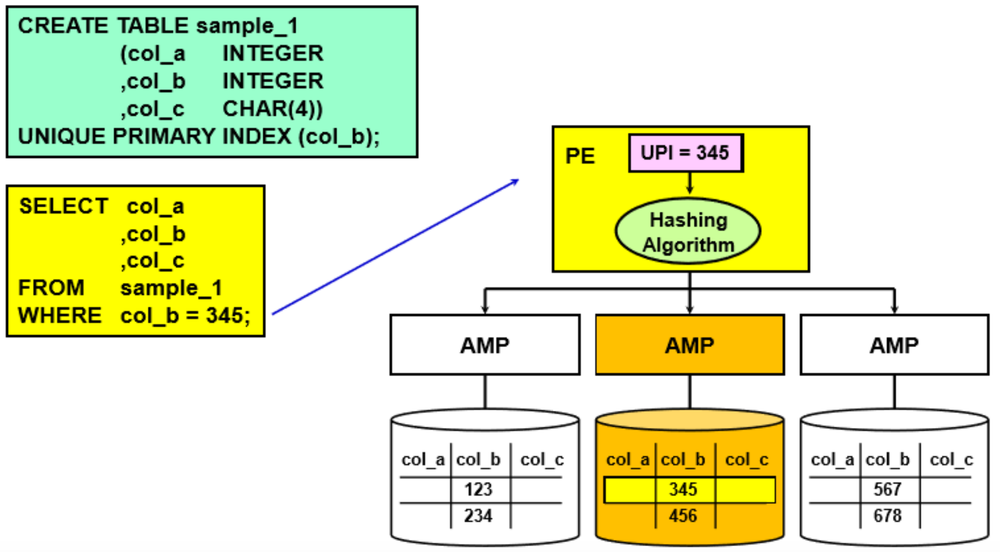

**Доступ к данным с помощью не уникального первичного индекса:**
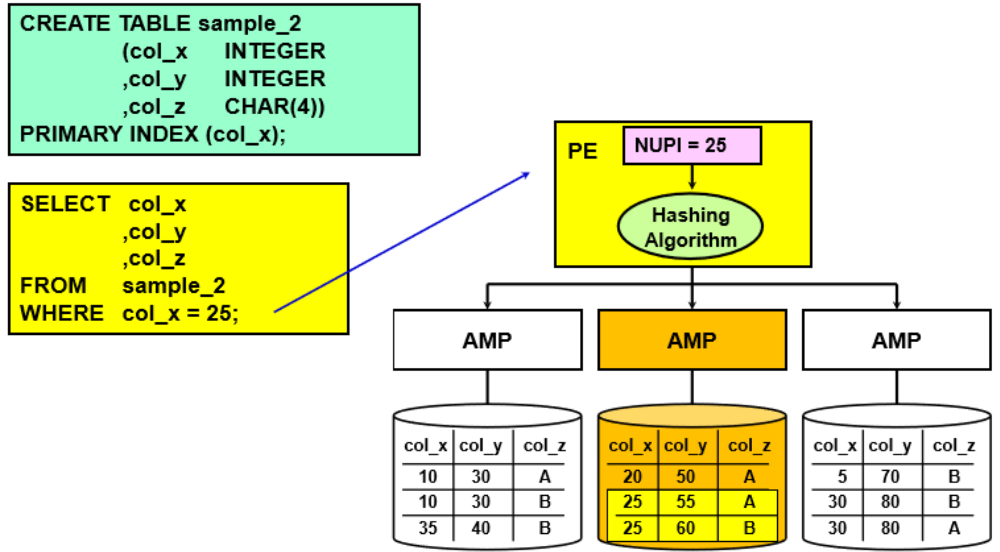

Критерии выбора первичного индекса:

    • Доступ к данным столбцов первичного индекса должен осуществляться чаще остальных
    • Распределение значение должно быть равномерным и без выбросов
    • Для больших таблиц количество уникальных значение должно превышать количество узлов как минимум в 10 раз
    • Изменения данных не должно происходить слишком часто

**Best practice:**
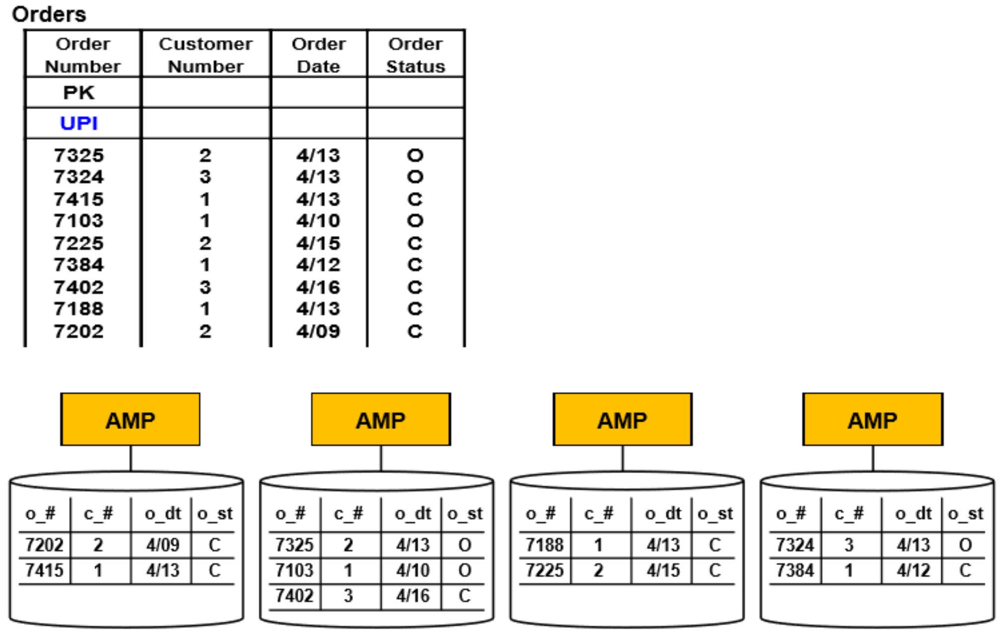

**Bad practice:**
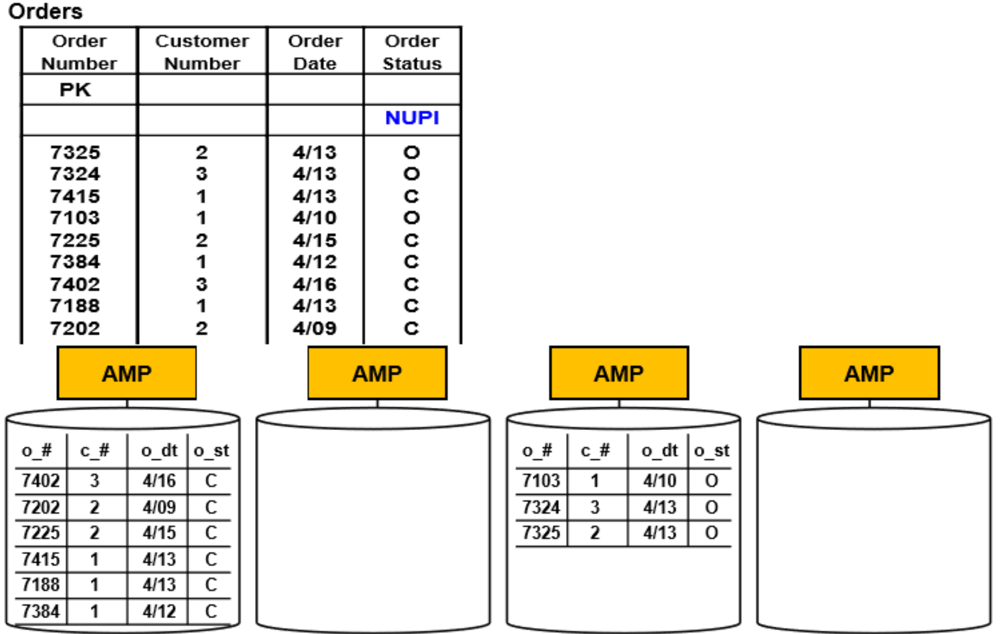

Вторичный индекс является альтернативным путем доступа к данным

    • Не влияет на дистрибьюцию данных по узлам
    • Увеличивает как и хранимые на диске данные, так и повышает расходы на поддержку системы
    • Может быть добавлен или удален в любое время
    • Используется для повышения производительности

**Доступ к данным с помощью вторичного индекса:**
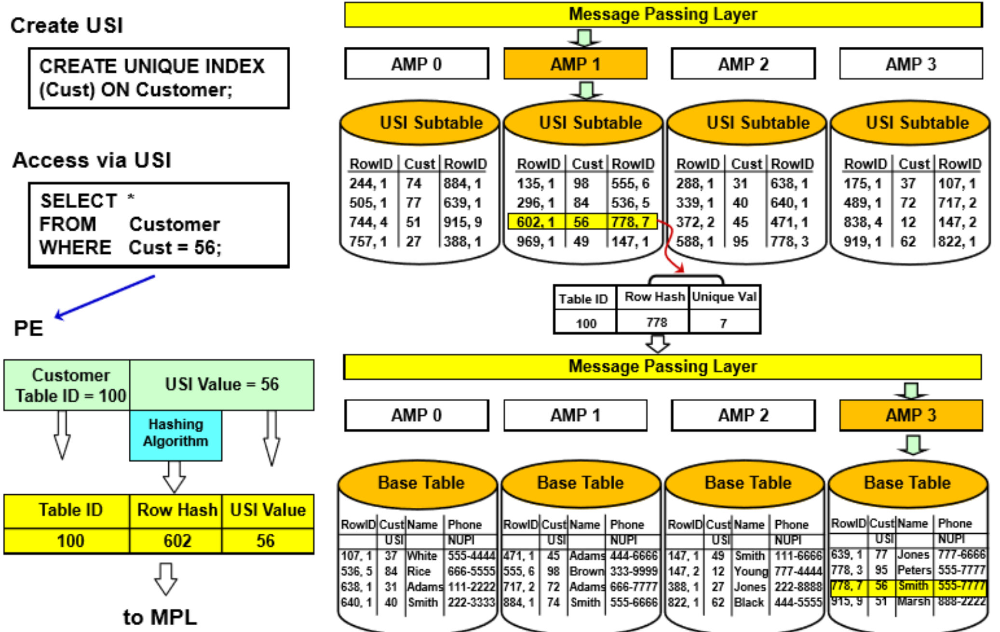

Немного информации о вторичном индексе:

    • Использование вторичного индекса увеличивает накладные расходы
    • Основной критерий использование вторичного индекса – частое использование полей в запросе
    • Если условие малоселективное, то выгоднее использовать полное сканирование (пороговое значение – 10%)
    • Лучше избегать использование вторичного индекса по часто обновляемым данным
    • Неиспользуемые индексы необходимо удалять

Полное сканирование таблицы означает чтение каждой строки. Происходит в том случае, если:
    
    • Поля индекса не используются в запросе
    • Поля индекса используются в сложных условиях (не равенство)

Партицирование – физическое разделение данных по какому-то полю.

    1) Строки распределяются по AMP в зависимости от первичного индекса
    2) На каждом AMP строки делятся по номеру партиции
    3) Внутри партиции строки сортируются обычным способом

Преимущества партицирования:
    
    • При использовании в запросе таблицы, по которой произведено партицирование, читается только необходимый блок информации
Недостатки партицирования:
    
    • Накладные расходы на хранение и вставку записей
    • Запросы без использования колонок партицирования работают хуже
    • Не работает MergeJoin без использования колонок партицирования

## Vertica

**Vertica** - реляционная колончатая СУБД.

В отличие от традиционных баз, хранящих данные в формате строк, Vertica хранит данные в виде колонок в сжатом виде. Такое хранение позволяет иметь большую степень сжатия, освобождая при этом много дискового пространства.

**Логическая архитектура:**
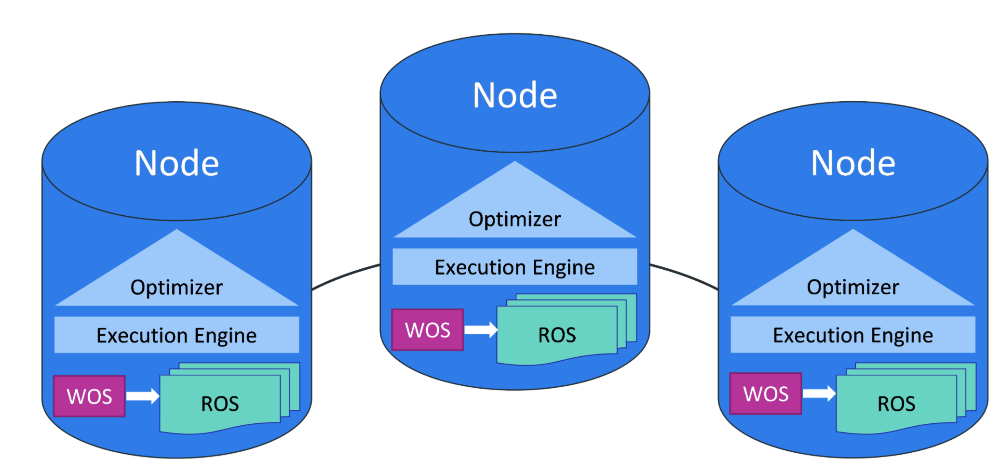

В Vertica существует двухкомпонентное хранилище данных, состоящие из:

    • WOS (write optimized storage) – хранилище в оперативной памяти
    • ROS (read optimized storage) – хранилище на диске

**Выполнение запроса в вертике:**
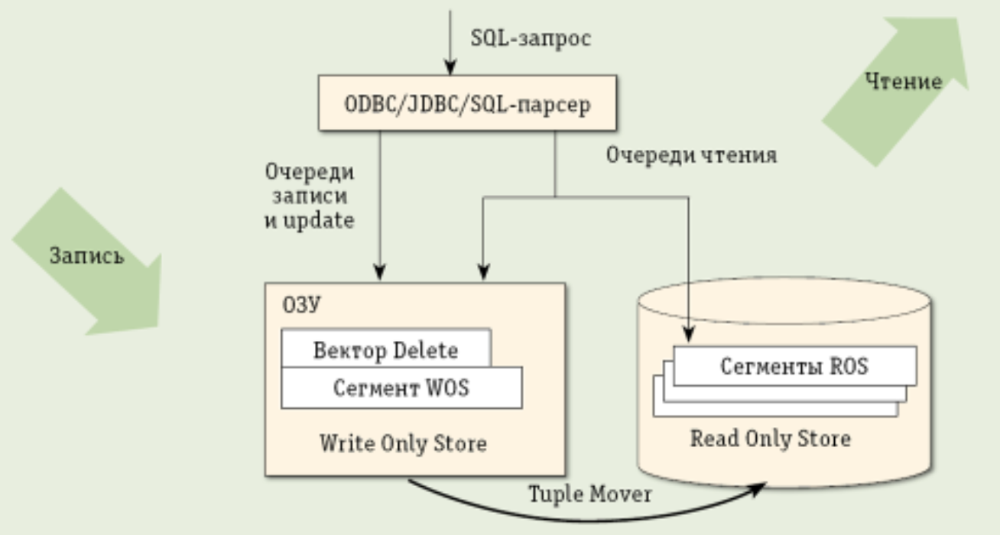

При использовании операции COPY, INSERT, UPDATE мы автоматически попадаем в WOS (Write Optimized Store) — область, где данные не оптимизированы для чтения и сортируются только при запросе, хранятся без сжатия или индексирования. Если объемы данных слишком велики для области WOS, то с помощью дополнительной инструкции DIRECT их стоит писать сразу в ROS. Иначе WOS будет переполнен, и у нас случится сбой.

По истечении заданного в настройках времени данные из WOS перетекают в ROS (Read Optimized Store) — оптимизированную, ориентированную на чтение структуру дискового хранилища. В ROS хранится основная часть данных, здесь она сортируется и сжимается. Данные в ROS разделены на контейнеры хранения. Контейнер представляет собой набор строк, созданных операторами трансляции (COPY DIRECT), и хранится в определенной группе файлов.

**Tuple Mover** - асинхронный процесс, осуществляющий перемещение данных между хранилищами.

**Преимущества колоночного хранения данных:**
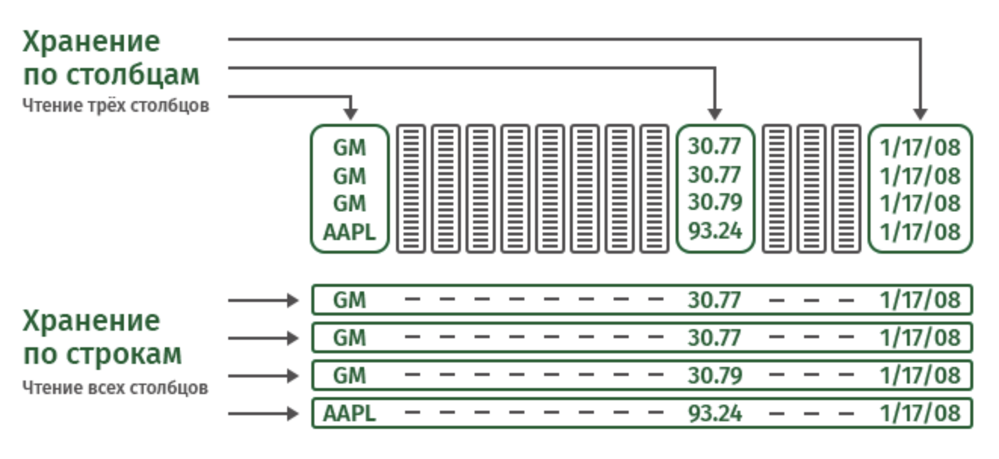

Интересные фичи в вертике:

    • проекции
    • RLE сжатие
    • flex-таблицы

**Кодирование длин серий** (англ. run-length encoding, **RLE**) или кодирование повторов — алгоритм сжатия данных, заменяющий повторяющиеся символы (серии) на один символ и число его повторов. Серией называется последовательность, состоящая из нескольких одинаковых символов. При кодировании (упаковке, сжатии) строка одинаковых символов, составляющих серию, заменяется строкой, содержащей сам повторяющийся символ и количество его повторов.

Пример: 
    
    ААААА -> 5А

**Проекция** - физическая единица хранения информации. 

Проекции бывают нескольких типов:

    • суперпроекции (Superprojection),
    • запрос-ориентированные проекции (Query-Specific Projections),
    • агрегированные проекции (Aggregate Projections).

При создании любой таблицы автоматически создается суперпроекция, которая содержит все колонки нашей таблицы. Если нужно ускорить какой-то из регулярных процессов, мы можем создать специальную запрос-ориентированную проекцию, которая будет содержать, допустим, 3 столбца из 10. Данные во всех проекциях автоматически обновляются при обновлении записей таблицы.

Создавая проекции, нужно оценивать, хватает ли нашим запросам суперпроекций. Для больших таблиц следует создавать сегментированную проекцию. Она разбивается на сегменты, которые распределяются по нескольким нодам, что повышает отказоустойчивость и минимизирует нагрузки на одну ноду. Если таблички маленькие, то лучше делать несегментированные проекции. Они полностью копируются на каждую ноду, и производительность таким образом увеличивается. В терминах Vertica «маленькая» таблица — это примерно 1 млн строк.

**Flex-таблицы** - таблицы для хранения неструктурированных или полуструктурированных данных.

##  ClickHouse

**ClickHouse** — это колоночная аналитическая СУБД с открытым кодом, позволяющая выполнять аналитические запросы в режиме реального времени на структурированных больших данных, разрабатываемая компанией Яндекс.
Разработан для решения задач веб-аналитики.

Отличительные особенности по версии clickhouse.yandex:

    • По-настоящему столбцовая СУБД
    • Сжатие данных как в вертике
    • Хранение данных на диске
    • Параллельная обработка запроса на многих процессорных ядрах
    • Поддержка SQL
    • Обновление данных в реальном времени
    • Векторный движок
    • Наличие индекса
    • Подходит для онлайн запросов
    • Prewhere оптимизация*

При **оптимизации prewhere** сначала читываются только те столбцы, которые необходимы для выполнения выражения prewhere. Затем читаются другие столбцы, необходимые для выполнения остальной части запроса, но только те блоки, в которых находится выражение prewhere «верно» по крайней мере для некоторых рядов. 

Недостатки по версии clickhouse.yandex:

    • Отсутствие полноценных транзакций
    • Возможность изменять или удалять ранее записанные данные с низкими задержками и высокой частотой запросов не предоставляется
    • Разреженный индекс делает ClickHouse плохо пригодным для точечных чтений одиночных строк по своим ключам

Использует собственный диалект SQL, не соответствующий стандарту, но содержащий расширения (массивы, функции для работы с URL):
    
    • Нет точечных update/delete
    • Нельзя джойнить больше двух таблиц
    • Нет аналитических функций

# Проектирование хранилища

Проектирование хранилища происходит по большей степени на этапе построения логической модели данных. Хранилище не появляется из ниоткуда. Зачастую, когда появляется цель построить хранилище, данные о предметной области, либо же система источник уже существуют. Поэтому точкой отсчета для нашего упражнения будет являться набор таблиц в третьей нормальной форме из TPC-H - теста http://www.tpc.org/tpc_documents_current_versions/pdf/tpc-h_v2.17.3.pdf. Этот набор описывает некий магазин, со всеми его атрибутами.

**Исходный набор данных:**
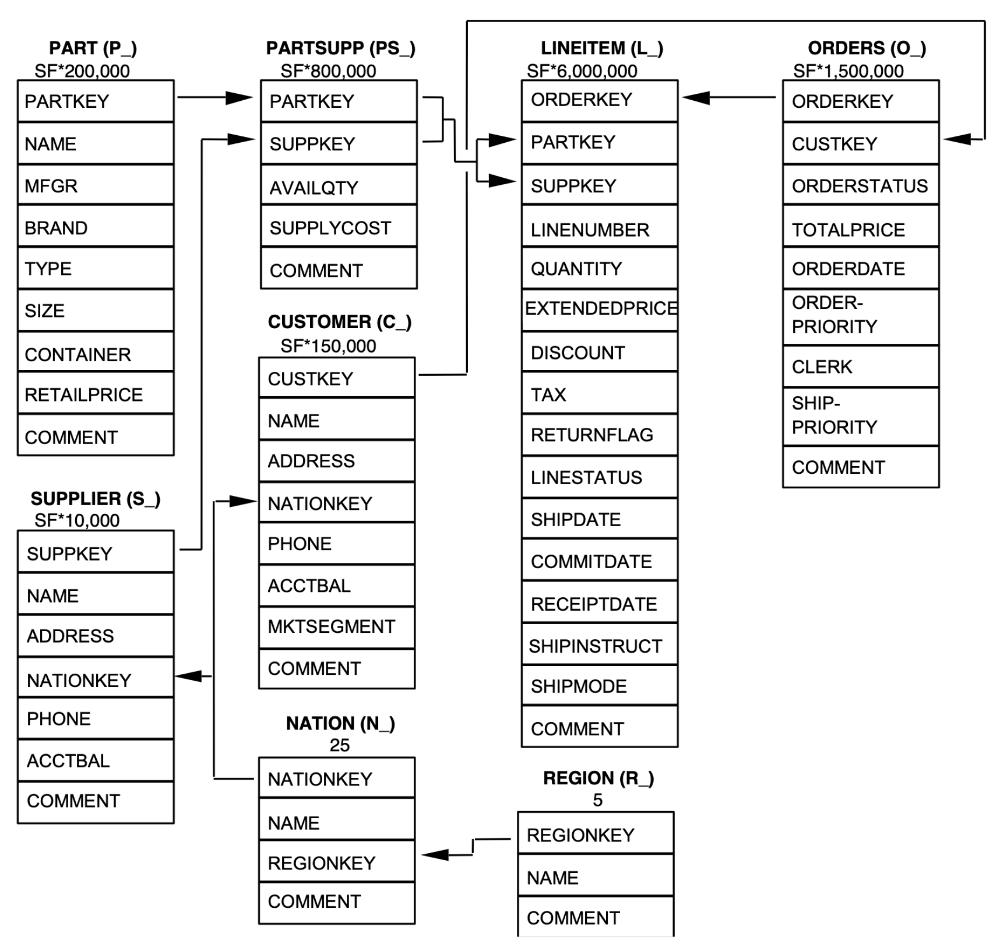

## Data vault

На основе исходных данных, можно сделать выводы, что бизнес сущностями будут являться:

    • h_part
    • h_supplier
    • h_customer
    • h_orders
    • h_nation
    • h_region

Выделим эти бизнес сущности в хабы, согласно методологии Data vault:

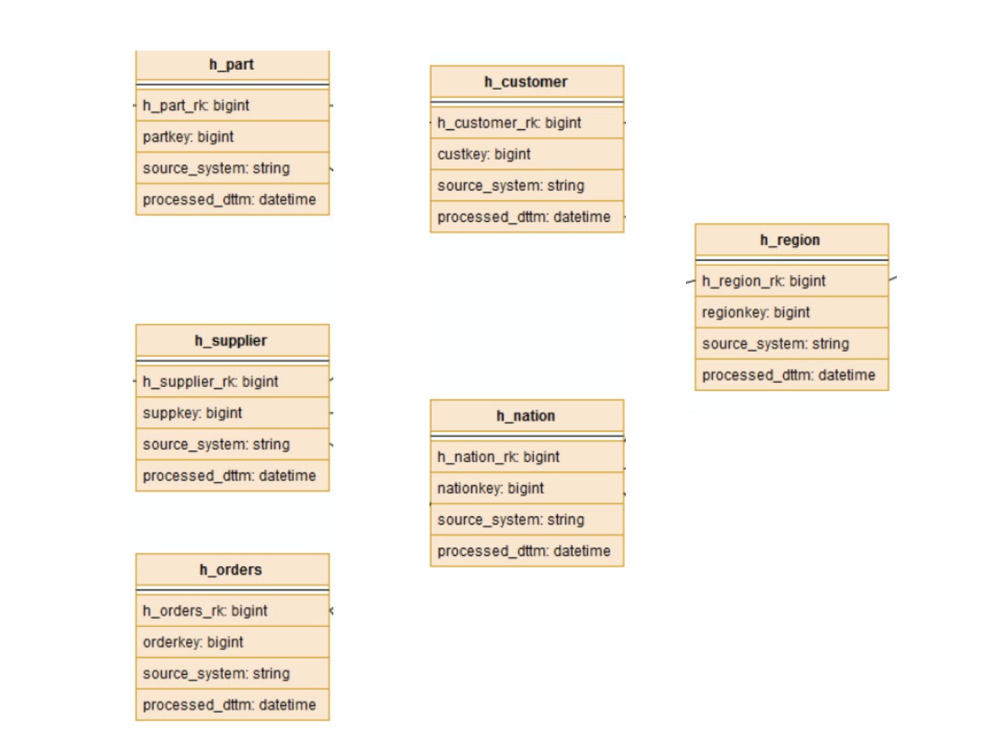

Все хабы имеют префикс h_. Хабы содержат суррогатный ключ, поле с постфиксом _rk (первая строка). Он будет сгенерирован в выбранной нами базе данных. Второй строкой идет бизнес ключ из системы источника. Далее идут системные поля: source_system - информация о системе источнике, processed_dttm - дата загрузки.

Следующим этапом смоделируем линки на основе таблиц в источнике. Посмотрим еще раз на исходную модель данных, с уже выделенными нами хабами Рисунке 8. По сути, задача сводится к тому, чтобы вычленить связи между таблицами, которые мы выделили в хабы. На основе рисунка сделать это весьма тривиально:

    • l_part_supplier
    • l_part_supplier_orders 
    • l_nation_supplier
    • l_customer_orders
    • l_nation_customer
    • l_nation_region

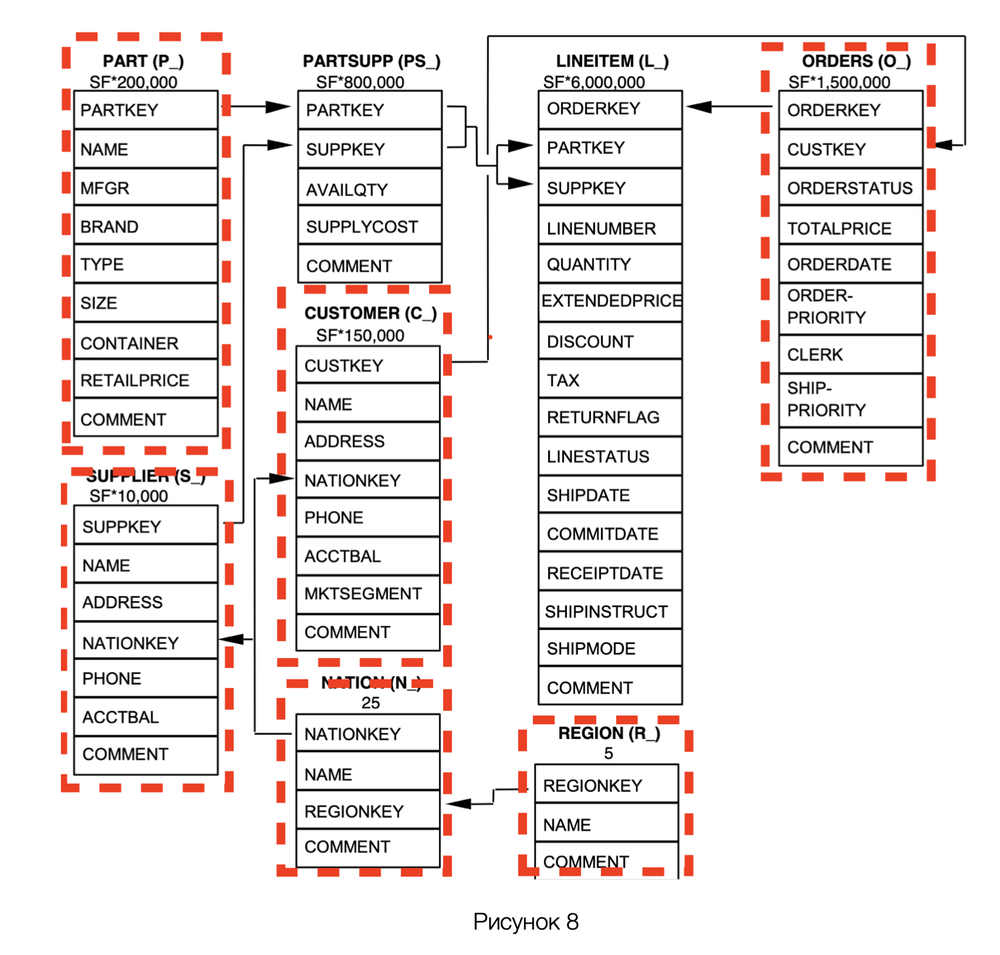

Все линки имеют префикс l_. Линки содержат суррогатный ключ, поле с постфиксом _rk (первая строка). Далее идут суррогатные ключи хабов, которые используются для связи хабов через линк. По ним, с помощью join, можно денормализовать данные в витрины. Также линки содержат системные поля: source_system - информация о системе источнике, processed_dttm - дата загрузки.

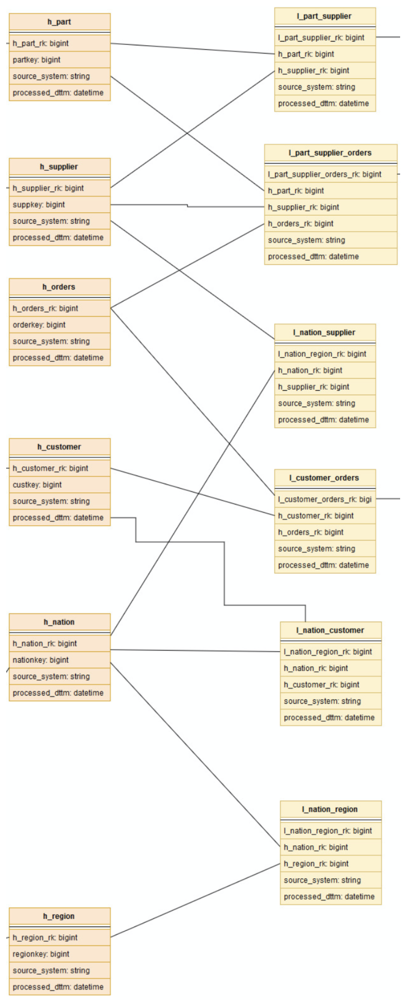

Заключительным этапом нужно смоделировать сателлиты. Фактически, мы выносим описательную информацию о хабах/линках в отдельные таблицы. Для хабов, отмеченных красным на рисунке 8, все поля, не являющимися бизнес ключами, выносятся в сателлит этого хаба.

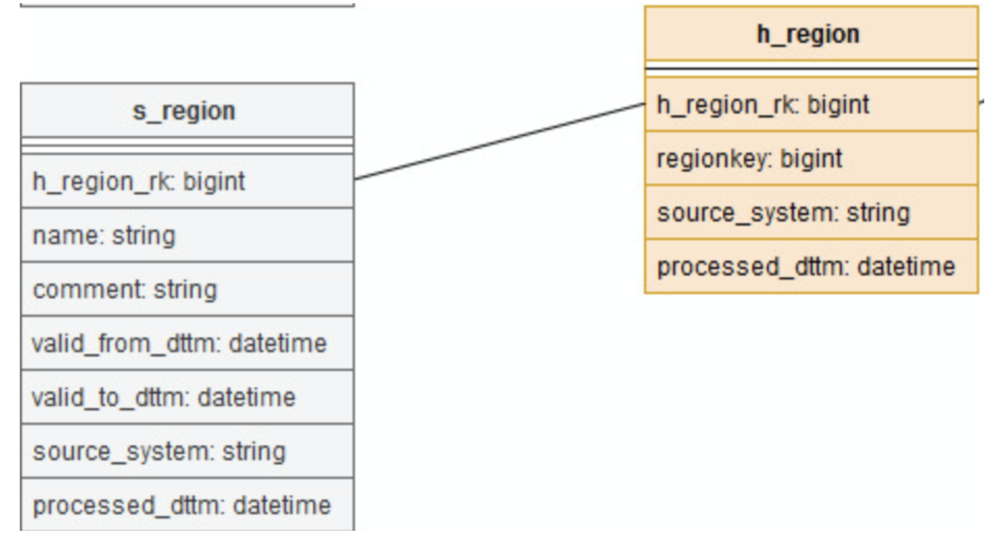

Рассмотрим таблицы **lineitem** и **partsupp**. В них содержится описательная информация о линках **part_supplier_orders** и **part_supplier** соответсвенно. Следовательно сателлит будет повешен на линк.

Все сателлиты  имеют префикс s_ рядом с хабами и l_s_ рядом с линками. Сателлиты содержат в себе: 

    • Суррогатный ключ сателлита (_rk)
    • Суррогатный ключ хаба/линка 
    • Строки с описательной информацией из таблиц источников
    • Два поля для поддержания версионности valid_from_dttm, valid_to_dttm 
    • Cистемные поля source_system, processed_dttm 

**Итоговый вид модели:**
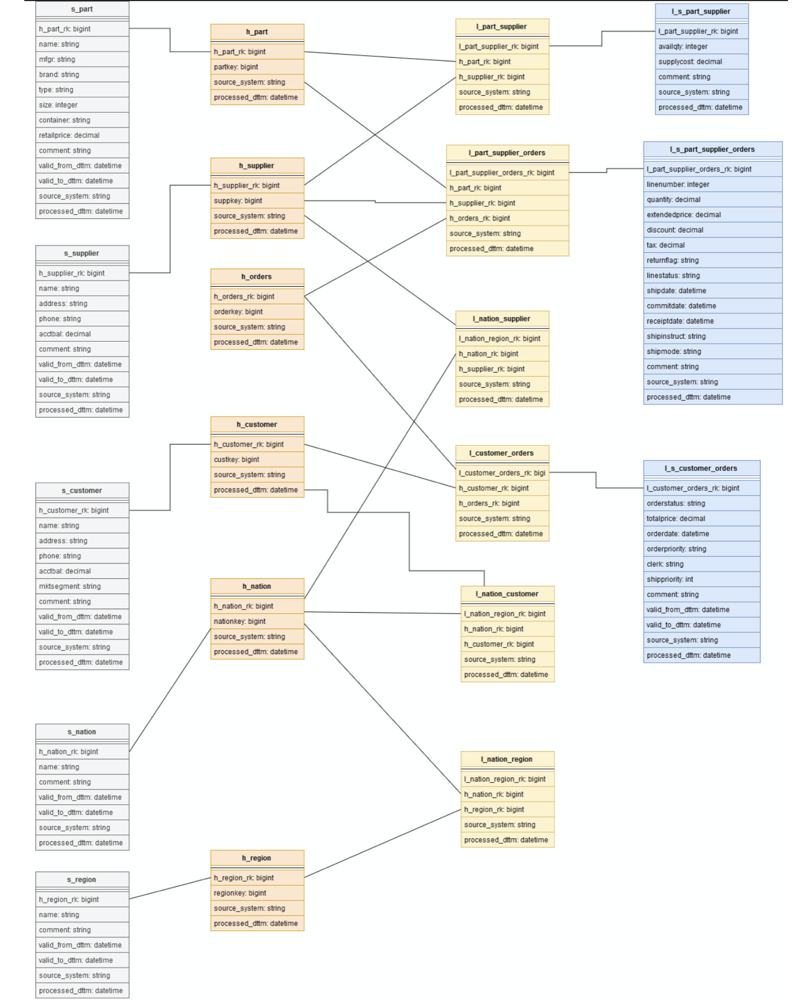

## Anchor modeling

Как и в подходе Data vault, первым шагом будет моделирование якорей (хабов). На первый взгляд якоря будут совпадать с хабами из предыдущего подхода, но это не так. В якорном моделировании нельзя повесить атрибут (сателлит) на связь. Из-за этого, для того чтобы представить исходную модель в виде якорной нужно добавить еще два якоря partsupp и lineitem. Фактически, все таблицы из исходной модели данных стали якорями. Итоговый список якорей:

    • a_part
    • a_supplier
    • a_customer
    • a_orders
    • a_nation
    • a_region
    • a_partsupp
    • a_lineitem

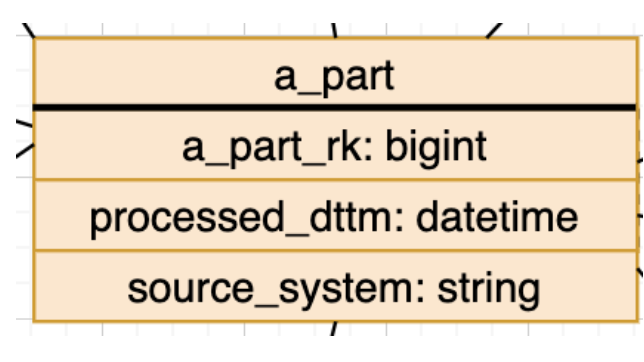

Все якоря имеют префикс a_. В якорь входят суррогатный ключ и технические поля. Бизнес ключ сущности выносится в атрибуты.

Следующим шагом нужно соединить между собой все якоря с помощью связей. Поскольку количество якорей больше чем количество хабов, количество связей тоже увеличиться. Общий список связей:

    • t_part_partsupp
    • t_partsupp_supplier
    • t_partsupp_lineitem
    • t_orders_lineitem
    • t_customer_orders
    • t_nation_supplier
    • t_nation_customer
    • t_nation_region

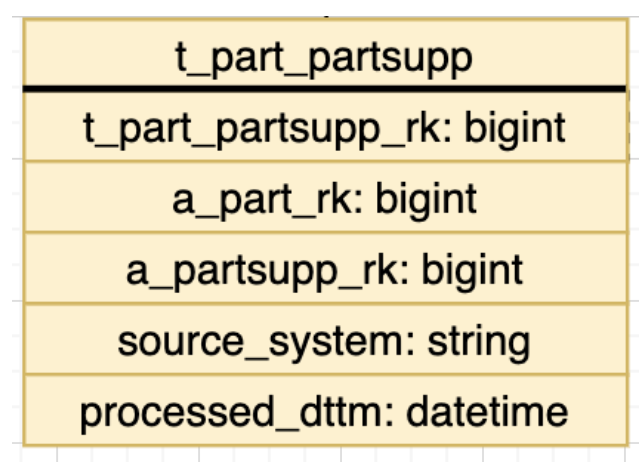

Все связи имеют префикс t_. Связь включает суррогатный ключ самой себя, суррогатные ключи якорей и системные поля.

Заключительным шагом нужно навесить атрибуты на якоря. Фактически все поля из исходного набора таблиц попадают в атрибуты соответствующего якоря.

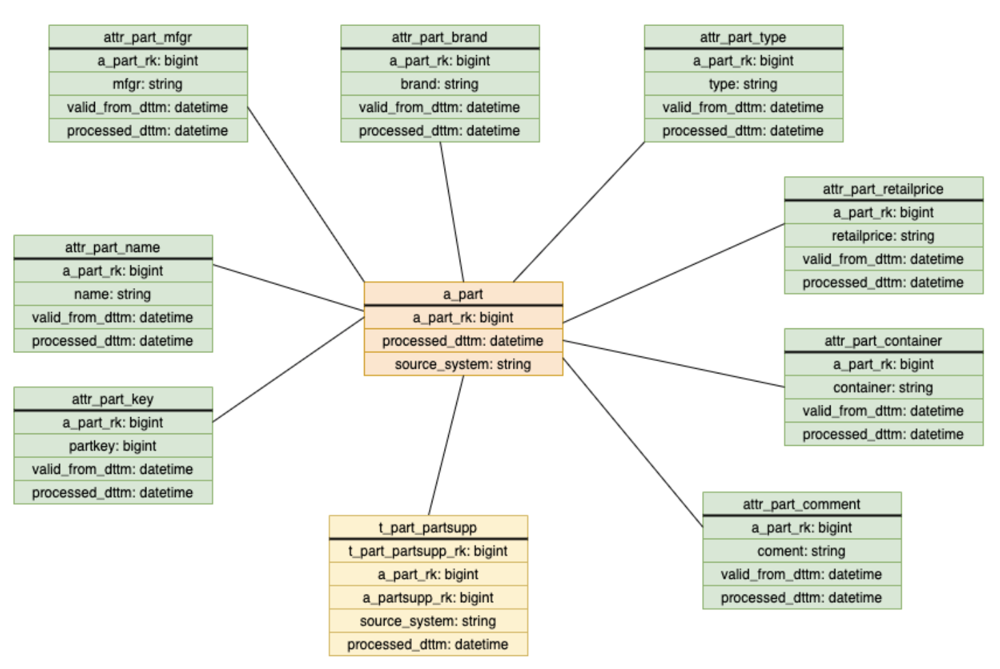

Все атрибуты имеют префикс attr_. Включает в себя суррогатный ключ якоря, значение атрибута (значение из источника), верстанное поле, системные поля.

**Итоговый вид модели:**
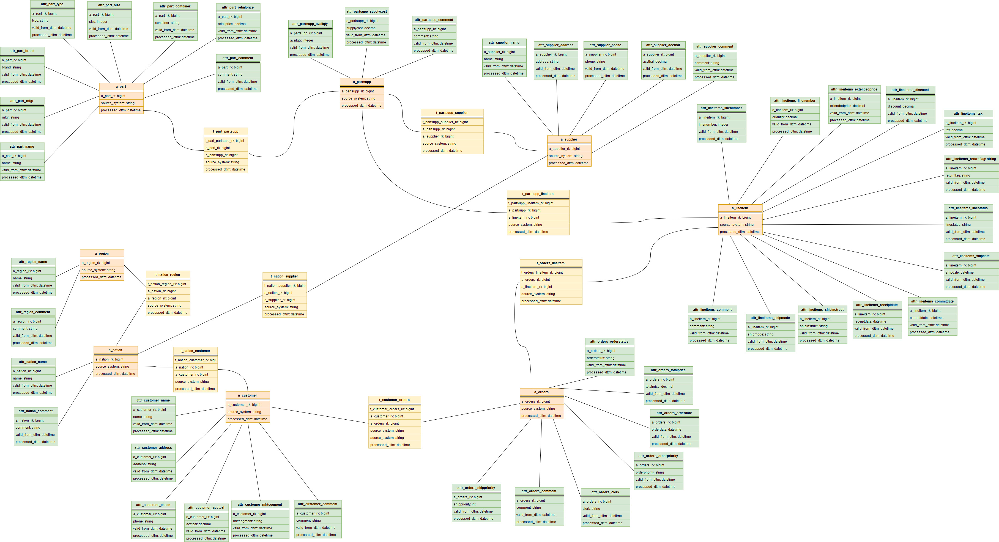

# Резюме

В данном уроке мы увидели сходства и различия построения модели хранилища на основе методологий Data vault и Anchor modeling. На основе одного и того же набора данных мы получили разного вида читаемости логические модели. Для данной предметной области более понятной будет являться подход Data vault. Однако нет какой-то одной версии правды. Выбор подхода проектирования зачастую зависит и от предоставленного количества времени, ресурсов и компетенций. Знание общих концепций позволяет инженеру данных выбрать эффективный метод решения проблемы.

Источники:

    • https://clickhouse.tech/docs/ru/introduction/distinctive-features/
    • https://www.vertica.com/docs/9.2.x/HTML/Content/Authoring/AdministratorsGuide/Projections/WorkingWithProjections.htm
    • https://habr.com/ru/company/sberbank/blog/414895/
    • https://habr.com/ru/post/209078/

## Домашнее задание

Спроектировать логические схемы Data vault и Anchor model на примере базы Northwind:

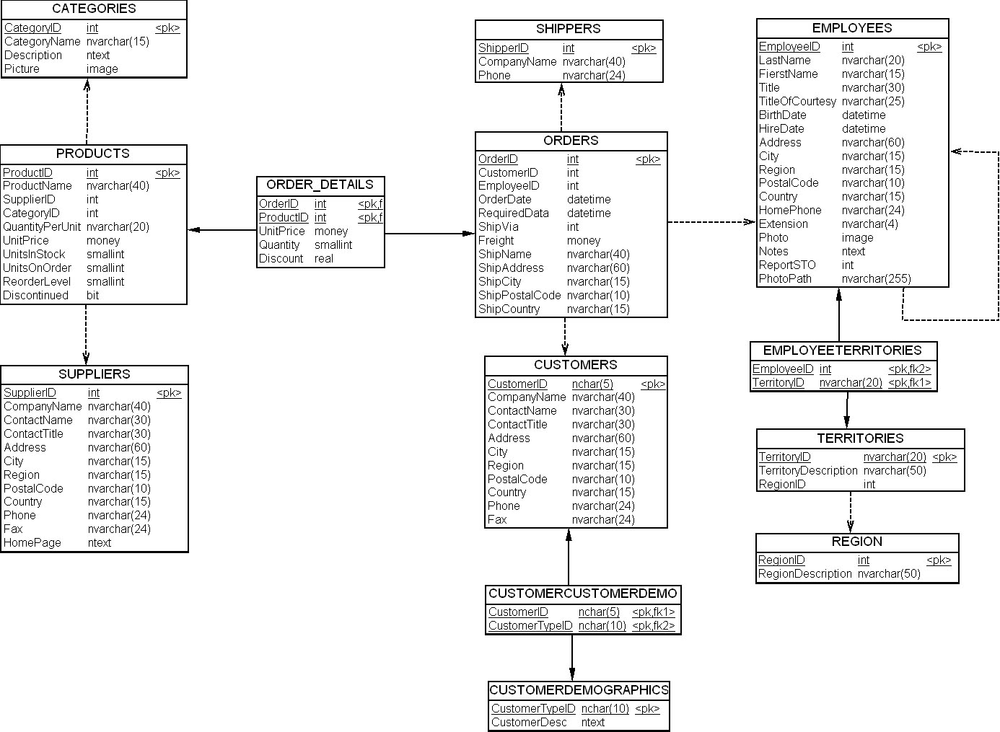